In this analysis I will be utilizing two different forecast models: a SARIMA forecast and a polynomial forecast. These forecast models will be used to forecast water levels for each water basin in Arizona, providewd it contains current data. My forecasts will attempt to predict the water table levels for the three years. I have included notes along with my code to help explain what is happening in each cell, the results/visuals are available at the end of this document, showing the difference between the two forecasts and the original data.

The code for this analysis is somewhat long so I could show each step of this process. The final visuals and forecasts are available outside of this file.

In [2]:
# Here I am loading the libraries I will use throughout the analysis.

import numpy as np
import pandas as pd
from statistics import mean
from statistics import median
import seaborn as sns
import datetime as dt

from statsmodels.tsa.arima.model import ARIMA
import pmdarima as pm

import matplotlib.dates as mpl_dates
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

To build the final useable dataset, I need to merge three different tables from the ADWR (Arizoan Department of Water) database: GWSI_SITES, GWSI_WW_LEVELS, GWSI_ADWR_BASINS.

In [4]:
# Loading in the GWSI_SITES table.
# This is the table where the basins abbreviations, for simplified identification, come from.

sites_data = pd.read_excel('Data_Tables/GWSI_SITES.xlsx', index_col=0)

In [5]:
# loading in the WW_LEVELS table
# This table includes observations from all monitored wells in Arizona.

ww_data = pd.read_excel('Data_Tables/GWSI_WW_LEVELS.xlsx', index_col=0, parse_dates=['WLWA_MEASUREMENT_DATE'])

In [6]:
# Loading in the GWSI_ADWR_BASINS table
# This table includes the full name for the water basin.

basin_code = pd.read_excel('Code_Tables/GWSI_ADWR_BASINS.xlsx', index_col=0)

In [7]:
# Here I reset the index so these data frames can be used properly.

sites_data.reset_index(inplace=True)
basin_code.reset_index(inplace=True)
ww_data.reset_index(inplace=True)

In [8]:
# Here I create a new dataframe with only the columns I am interested in to improve efficiency.

desc_data = sites_data[['SITE_WELL_SITE_ID', 'SITE_ADWBAS_CODE_ENTRY', 'SITE_WELL_ALTITUDE']].copy()

In [9]:
# This column is renamed to simplify merging with another table in the next cell.

basin_code.rename(columns={'CODE_ENTRY': 'SITE_ADWBAS_CODE_ENTRY'}, inplace=True)

In [10]:
# This is where I begin merging the three tables.

water_data = pd.merge(desc_data, basin_code, how='left', on=['SITE_ADWBAS_CODE_ENTRY'])

In [11]:
# This is where I create another dataframe, renaming columns to simplify merging and improving efficiency.

ww_tab = ww_data[['WLWA_SITE_WELL_SITE_ID', 'WLWA_MEASUREMENT_DATE', 'WLWA_DEPTH_TO_WATER']].copy()
ww_tab.rename(columns={'WLWA_SITE_WELL_SITE_ID': 'SITE_WELL_SITE_ID', 'WLWA_MEASUREMENT_DATE': 'MEASUREMENT_DATE', 'WLWA_DEPTH_TO_WATER': 'DEPTH_TO_WATER'}, inplace=True)

In [12]:
# Here I merge more tables.
# The DEPTH_TO_WATER column is also turned into a negative number.
# Turning this number into a negative makes the graphs more intuitive to the end user.
# As the number decreases in size, visually the well will appear deeper on a line graph

azwater_data = water_data[['SITE_WELL_SITE_ID', 'SITE_ADWBAS_CODE_ENTRY', 'CODE_DESCRIPTION']].copy()
azwater_data = pd.merge(azwater_data, ww_tab, how='inner', on=['SITE_WELL_SITE_ID'])
azwater_data['DEPTH_TO_WATER'] = azwater_data['DEPTH_TO_WATER'] *(-1)

In [13]:
print(azwater_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 293225 entries, 0 to 293224
Data columns (total 5 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   SITE_WELL_SITE_ID       293225 non-null  int64         
 1   SITE_ADWBAS_CODE_ENTRY  292727 non-null  object        
 2   CODE_DESCRIPTION        292727 non-null  object        
 3   MEASUREMENT_DATE        292893 non-null  datetime64[ns]
 4   DEPTH_TO_WATER          278464 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1), object(2)
memory usage: 11.2+ MB
None


In [14]:
# This is the final dataframe before the analysis begins. The data has been cleaned, merged, and simplified.
# Here is where all null values in the DEPTH_TO_WATER and MEASUREMENT_DATE columns are dropped.

ADWR_WELL = azwater_data[azwater_data['DEPTH_TO_WATER'].isnull() == False]
ADWR_WELL = ADWR_WELL[ADWR_WELL['MEASUREMENT_DATE'].isnull() == False]
ADWR_WELL = ADWR_WELL[ADWR_WELL['SITE_ADWBAS_CODE_ENTRY'].isnull() == False]

In [15]:
print(ADWR_WELL.info())

<class 'pandas.core.frame.DataFrame'>
Index: 277647 entries, 0 to 293219
Data columns (total 5 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   SITE_WELL_SITE_ID       277647 non-null  int64         
 1   SITE_ADWBAS_CODE_ENTRY  277647 non-null  object        
 2   CODE_DESCRIPTION        277647 non-null  object        
 3   MEASUREMENT_DATE        277647 non-null  datetime64[ns]
 4   DEPTH_TO_WATER          277647 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1), object(2)
memory usage: 12.7+ MB
None


In [16]:
well_names = ADWR_WELL['SITE_ADWBAS_CODE_ENTRY'].unique()

print(len(well_names))
print(well_names)

84
['DOU' 'SEV' 'SRF' 'SCA' 'SBV' 'CCK' 'GIL' 'SSI' 'DIN' 'LIC' 'USC' 'ESR'
 'MMU' 'HAR' 'VER' 'AVR' 'WIL' 'RAN' 'HUA' 'WSR' 'SSW' 'ARA' 'LVR' 'DET'
 'CRF' 'HAS' 'LCR' 'ELO' 'MST' 'UHA' 'SAC' 'WMD' 'BUT' 'UAG' 'AGV' 'WEM'
 'SRO' 'DNM' 'SAF' 'BIC' 'CHV' 'MAM' 'SKU' 'ALF' 'COP' 'WAT' 'YUM' 'DUN'
 'LPC' 'FNH' 'VEK' 'CGW' 'TON' 'DON' 'MOR' 'AGF' 'BON' 'DEN' 'WIK' 'DSW'
 'GSK' 'FTR' 'CIB' 'VRG' 'SRL' 'MEA' 'CRI' 'LKP' 'TIG' 'WRB' 'USR' 'BRB'
 'ALR' 'CLA' 'SMR' 'JCI' 'LKH' 'BUR' 'MHV' 'PSC' 'SHV' 'KAN' 'GWA' 'PAR']


To train and compare machine learning models, I will set aside a 6 year period for the training data, and a 2 year period for the validation data set. By creating each data set and appending them into the dictionary I can easily train each model on the same dataset. I will then compare the forecast results from each with the original validation data. To assess the accuracy of the forecasts the MAE of the different models forecasts will be used.

The final contents of each az_basins dictionary entry will be:

az_basins['basin']

    [0] = Full data set
    [1] = Dataset with date and measurements
    [2] = Validation Key
    [3] = Train data set (6 year period)
    [4] = Validation data set (2 year period)
    [5] = Test data set (2 year period)
    [6] = SARIMA Model
    [7] = SARIMA Summary
    [8] = SARIMA MAE
    [9] = SARIMA Forecast
    [10] = Poly Degree
    [11] = Poly Model
    [12] = Poly Forecast
    [13] = Poly MAE
    [14] = SARIMA Model
    [15] = SARIMA Summary
    [16] = SARIMA MAE Final
    [17] = SARIMA Forecast
    [18] = Poly Degree Final
    [19] = Poly Model Final
    [20] = Poly Forecast
    [21] = Poly MAE Final
    [22] = SARIMA Model Final
    [23] = SARIMA Summary Final
    [24] = SARIMA Forecast Final
    [25] = Poly Forecast Final


In [18]:
# Here I create a dictionary of every well in the dataset. This will house the results for each individual well for the remaineder of the analysis.

az_basins = {}

for name in well_names:
    key_name = name
    d = ADWR_WELL[ADWR_WELL['SITE_ADWBAS_CODE_ENTRY'] == name]
    az_basins[key_name] = []
    az_basins[key_name].append(d)
    

At this point the data has no missing values in either the dates of measurement or the depth of measurement.  For the forecasts to operate properly, the values should be evenly spaced for the most accurate results. To accomplish this, I will be reframing the dataframe so the measurements occur once a month as an aggregate across the different wells, and I will place the measurements at the start of the month. I will also be interpolating any data for the months that may not have been measured so the model can function properly. An interpolation will work here because any drastic changes will still be reflected in the interpolated data.

In [20]:
# In this cell I resample the data to be in a single month format, I also remove any outliers from each water.
# Each water basin is an aggregate of every well in that water basin.
# Removing outliers is important since not every measurement is indicicative of the over all trend, or useful for forecast.
# I will also be utilizing a rollig average to try and smooth some of the differences in well measurements and improve forecasting.
# This cell appends a key to the dictionary so that only water tables with sufficiant information are utilized.

date_cutoff = '2023-09-01'
date_cutoff = pd.to_datetime(date_cutoff)
date_cut = np.datetime64(date_cutoff)
date_cut = pd.to_datetime(date_cut)

entry_date = '2008-01-01'
entry_date = pd.to_datetime(entry_date)
enter_date = np.datetime64(entry_date)
enter_date = pd.to_datetime(enter_date)


for basin in az_basins:
    
    az_basins[basin].append(az_basins[basin][0][['MEASUREMENT_DATE', 'DEPTH_TO_WATER']].copy())
    
    data = az_basins[basin][1]
    
    measure = data['MEASUREMENT_DATE'].max()
    
    if measure >= date_cut:
        data = data[data['MEASUREMENT_DATE'] >= enter_date]

        q3, q1 = np.percentile(data['DEPTH_TO_WATER'], [75 ,25])
        iqr = q3 - q1

        upper_b = q3 + (1.5 *iqr)
        lower_b = q1 - (1.5 *iqr)

        print(upper_b)
        print(lower_b)

        datum = data[data['DEPTH_TO_WATER'] >= lower_b]
        datum = datum[datum['DEPTH_TO_WATER'] <= upper_b]
        measured = datum['MEASUREMENT_DATE'].max()
        if measured >= date_cut:
            az_basins[basin].append('maintained')
            az_basins[basin][1] = datum.copy()
            print('maintained')
        elif measured <= date_cut:
            az_basins[basin].append('invalid')
            print('invalid')
            print('measured')
    elif measure <= date_cut:
        az_basins[basin].append('invalid')
        print('invalid')
    

    print(basin)
    print(date_cut)
    print(measure)

    print(len(az_basins[basin]))
    az_basins[basin][1] = az_basins[basin][1].set_index('MEASUREMENT_DATE').resample('MS')["DEPTH_TO_WATER"].median()
    az_basins[basin][1] = az_basins[basin][1].to_frame()
    az_basins[basin][1] = az_basins[basin][1].interpolate()
    #dataframe_m = az_basins[basin][1].set_index('MEASUREMENT_DATE').resample('MS')["DEPTH_TO_WATER"].median()
    az_basins[basin][1] = az_basins[basin][1].rolling(window=4).mean()
    print(len(az_basins[basin]))
    print(az_basins[basin][1].info(), '\n')


154.85000000000002
-490.35
maintained
DOU
2023-09-01 00:00:00
2023-11-02 16:25:00
3
3
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 190 entries, 2008-02-01 to 2023-11-01
Freq: MS
Data columns (total 1 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   DEPTH_TO_WATER  187 non-null    float64
dtypes: float64(1)
memory usage: 3.0 KB
None 

309.4749999999999
-645.5249999999999
maintained
SEV
2023-09-01 00:00:00
2023-11-15 14:55:00
3
3
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 191 entries, 2008-01-01 to 2023-11-01
Freq: MS
Data columns (total 1 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   DEPTH_TO_WATER  188 non-null    float64
dtypes: float64(1)
memory usage: 3.0 KB
None 

159.6625
-292.03749999999997
maintained
SRF
2023-09-01 00:00:00
2023-11-16 11:30:00
3
3
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 191 entries, 2008-01-01 to 2023-11-01
Freq: MS
Da

In [21]:
# This is where the training and validation sets are added to the dictionary.
# This helps ensure that the same data is used on all models.

for basin in az_basins:
    basin_train = az_basins[basin][1].loc["2013-10-01":"2019-09-01"]
    basin_valid = az_basins[basin][1].loc["2019-10-01":"2021-09-01"]
    basin_test = az_basins[basin][1].loc["2021-10-01":"2023-09-01"]
    
    print(basin)
    print(az_basins[basin][2])
    az_basins[basin].append(basin_train)
    print(az_basins[basin][3].info())
    az_basins[basin].append(basin_valid)
    print(az_basins[basin][4].info())
    az_basins[basin].append(basin_test)
    print(az_basins[basin][5].info(), '\n')

DOU
maintained
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 72 entries, 2013-10-01 to 2019-09-01
Freq: MS
Data columns (total 1 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   DEPTH_TO_WATER  72 non-null     float64
dtypes: float64(1)
memory usage: 1.1 KB
None
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 24 entries, 2019-10-01 to 2021-09-01
Freq: MS
Data columns (total 1 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   DEPTH_TO_WATER  24 non-null     float64
dtypes: float64(1)
memory usage: 384.0 bytes
None
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 24 entries, 2021-10-01 to 2023-09-01
Freq: MS
Data columns (total 1 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   DEPTH_TO_WATER  24 non-null     float64
dtypes: float64(1)
memory usage: 384.0 bytes
None 

SEV
maintained
<class 'pandas.core.frame

In [22]:
# This is the code that identifies the best settings for each SARIMA model, using the training dataset.
# It then stores those settings in the dictionary for each water basin.

for basin in az_basins:
    if az_basins[basin][2] == 'maintained':
        print()
        print(basin)
        print()
        smodel = pm.auto_arima(az_basins[basin][3]['DEPTH_TO_WATER'], start_p=1, start_q=1,
                          test='adf',
                          max_p=3, max_q=3,
                          m=12,
                          d=None,
                          seasonal=True,
                          start_P=0,
                          D=1,
                          trace=True,
                          error_action='ignore', 
                          suppress_warnings=True,
                          stepwise=True)

        key_name = basin
        az_basins[basin].append(smodel)    
        az_basins[basin].append(smodel.summary())
    else:
        pass
    
print('Complete')


DOU

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.17 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=516.868, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=459.367, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=480.013, Time=0.02 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=460.474, Time=0.16 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=459.946, Time=0.17 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=458.854, Time=0.08 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=460.259, Time=0.18 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=461.691, Time=0.25 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=496.320, Time=0.13 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,1,1)[12] intercept   : AIC=460.814, Time=0.19 sec

Best model:  ARIMA(1,1,0)(0,1,1)[12]      

In [23]:
# Here is where I will assess the accuracy of each model and determine a baseline for the accuracy of the machine learning models.

for basin in az_basins:
    if az_basins[basin][2] == 'maintained':    
        n_periods = 24
        print(basin)
        print(n_periods)
        print(az_basins[basin][6])
        fc = az_basins[basin][6].predict(n_periods = n_periods)
        print('step 1')
        index_of_fc = pd.date_range(az_basins[basin][4].index[0], periods = n_periods, freq = 'MS')
        print('step 2')
        fc_series = pd.Series(fc, index=index_of_fc)
        fc_frame = pd.DataFrame(fc_series)
        fc_frame.rename(columns={0: 'DEPTH_TO_WATER'}, inplace=True)
        s_mae = (fc_frame - az_basins[basin][4]).abs().mean()
        print('complete')
        print()

        az_basins[basin].append(s_mae)
        az_basins[basin].append(fc_frame)

    else:
        pass

print('Complete')

DOU
24
 ARIMA(1,1,0)(0,1,1)[12]          
step 1
step 2
complete

SEV
24
 ARIMA(0,1,0)(2,1,0)[12]          
step 1
step 2
complete

SRF
24
 ARIMA(2,2,0)(0,1,1)[12]          
step 1
step 2
complete

SCA
24
 ARIMA(0,1,0)(0,1,1)[12]          
step 1
step 2
complete

SBV
24
 ARIMA(1,2,0)(0,1,2)[12]          
step 1
step 2
complete

CCK
24
 ARIMA(1,1,0)(0,1,1)[12]          
step 1
step 2
complete

GIL
24
 ARIMA(3,1,2)(0,1,1)[12]          
step 1
step 2
complete

SSI
24
 ARIMA(3,1,0)(1,1,1)[12]          
step 1
step 2
complete

DIN
24
 ARIMA(2,1,1)(0,1,1)[12]          
step 1
step 2
complete

LIC
24
 ARIMA(0,1,1)(0,1,1)[12]          
step 1
step 2
complete

USC
24
 ARIMA(1,1,0)(1,1,0)[12]          
step 1
step 2
complete

ESR
24
 ARIMA(1,0,1)(0,1,1)[12]          
step 1
step 2
complete

MMU
24
 ARIMA(2,0,0)(2,1,0)[12]          
step 1
step 2
complete

HAR
24
 ARIMA(1,1,0)(2,1,0)[12]          
step 1
step 2
complete

VER
24
 ARIMA(1,1,0)(0,1,1)[12]          
step 1
step 2
complete

AVR
24
 AR

I have now established a baseline to assess the accuracy of the machine learning models moving forward. The result of the SARIMA model is not necessarily the target result but can assist in determining if the machine learning models produce a more accurate result than a standard statistical model might. Each SARIMA model was trained and assessed on the same training and validation datasets that the machine learning models will be.

In [25]:
# Each polynomial regression is chosen based on the RMSE (Root Mean Square Error).
# The RMSE will be used to compare one polynomial regression to another.
# Following this, the MAE will be used to see if the polynomial regression is more accurate than the SARIMA forecast.

for basin in az_basins:
    if az_basins[basin][2] == 'maintained':    
        train_ds = az_basins[basin][3].copy()
        train_ds.reset_index(inplace=True)
        
        x_train = train_ds['MEASUREMENT_DATE'].to_numpy()
        y_train = train_ds['DEPTH_TO_WATER'].to_numpy()

        valid_ds = az_basins[basin][4].copy()
        valid_ds.reset_index(inplace=True)

        x_test = valid_ds['MEASUREMENT_DATE'].to_numpy()
        y_test = valid_ds['DEPTH_TO_WATER'].to_numpy()

        X = np.arange(100).reshape(100, 1)
        y = X**4 + X**3 + X + 1

        rmses = []
        degrees = np.arange(1, 10)
        min_rmse, min_deg = 1e10, 1
        best_poly = 'tut'
        chosen_predict = 'tut'
        chosen_mae = 'tut'

        for deg in degrees:

            poly = PolynomialFeatures(degree = deg, include_bias = False)
            x_poly_train = poly.fit_transform(x_train.reshape(-1,1))
            poly_reg_model = LinearRegression()
            poly_reg_model.fit(x_poly_train, y_train)
            x_poly_test = poly.fit_transform(x_test.reshape(-1,1))
            poly_predict = poly_reg_model.predict(x_poly_test)
            poly_mse = mean_squared_error(y_test, poly_predict)
            poly_rmse = np.sqrt(poly_mse)
            rmses.append(poly_rmse)
            poly_mae = (pd.DataFrame(poly_predict) - pd.DataFrame(y_test)).abs().mean()

            if min_rmse > poly_rmse:
                min_rmse = poly_rmse
                min_deg = deg
                best_poly = poly_reg_model
                chosen_predict = poly_predict
                chosen_mae = poly_mae


        az_basins[basin].append(min_deg)
        az_basins[basin].append(best_poly)
        az_basins[basin].append(chosen_predict)
        az_basins[basin].append(chosen_mae)
    else:
        pass
    
print('Complete')


Complete


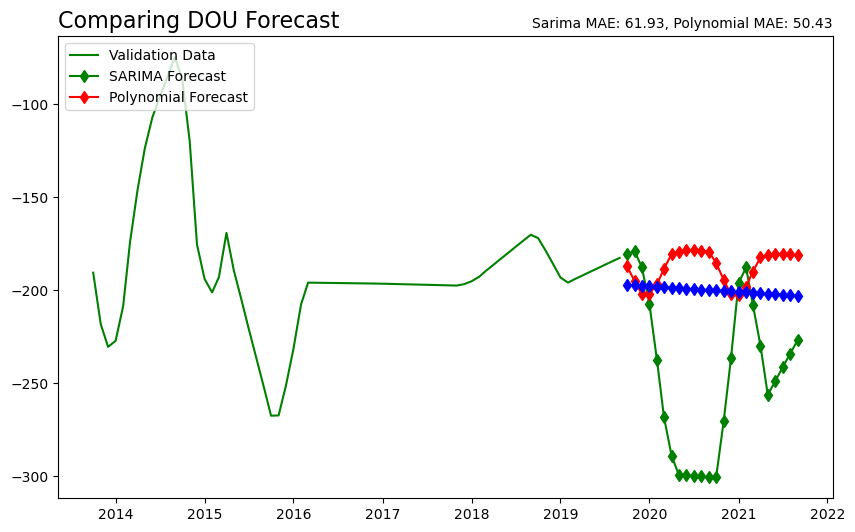

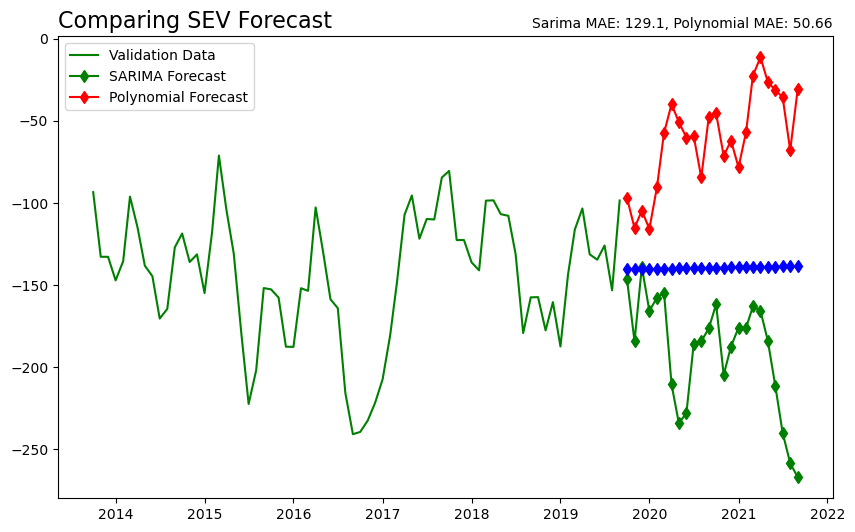

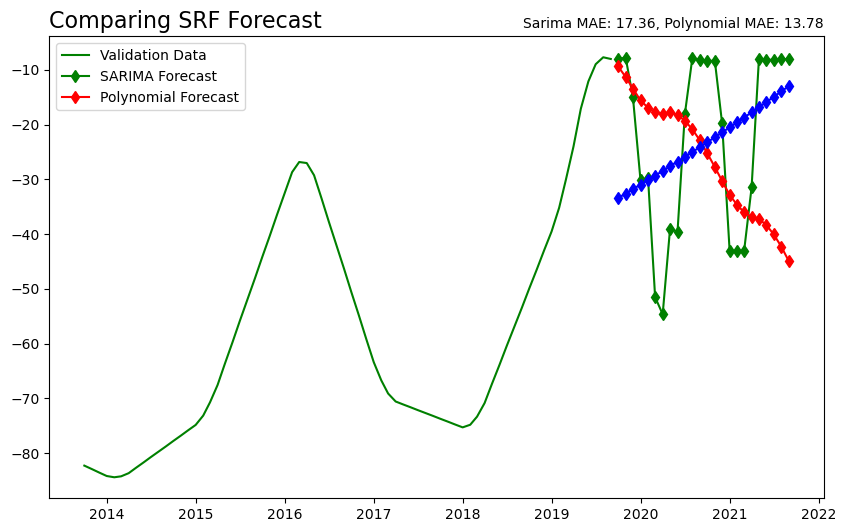

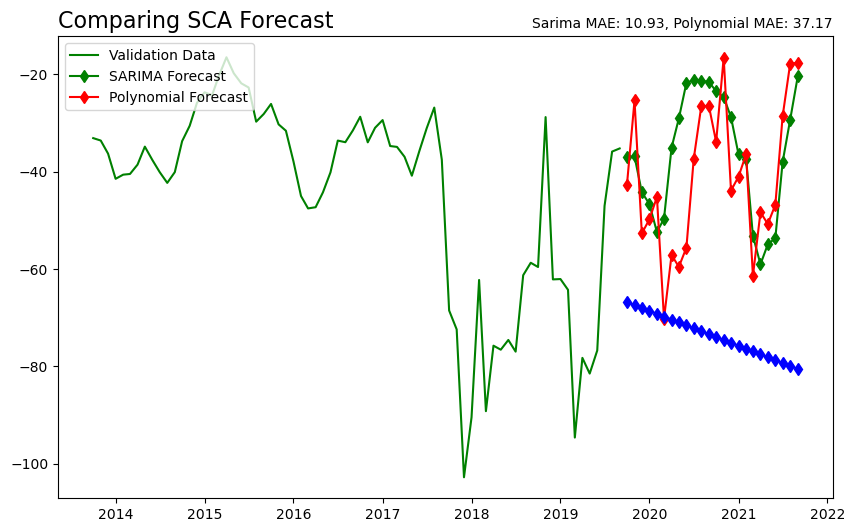

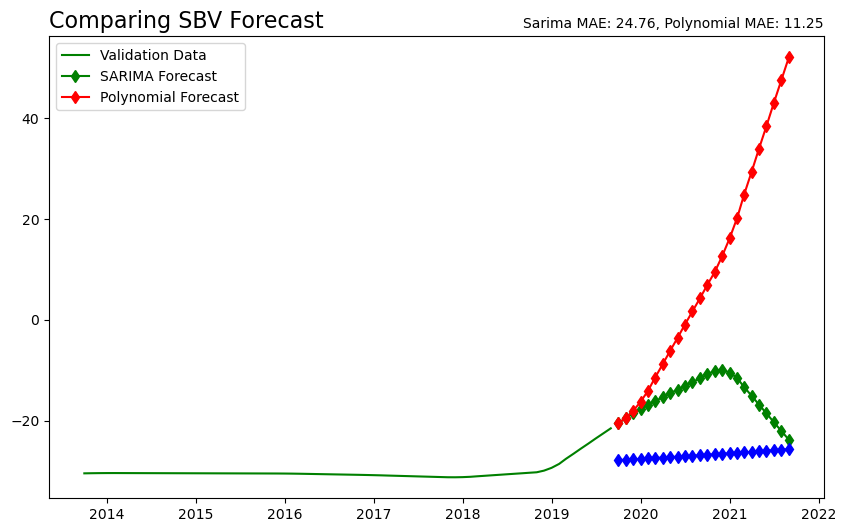

...

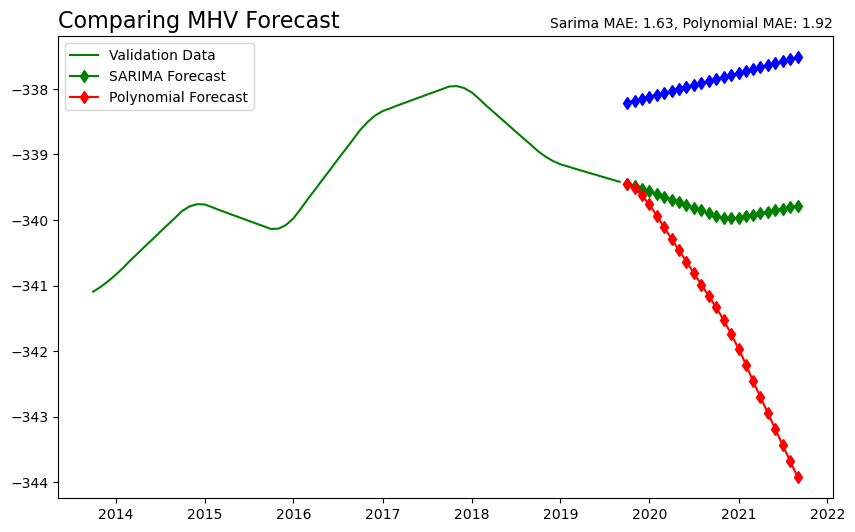

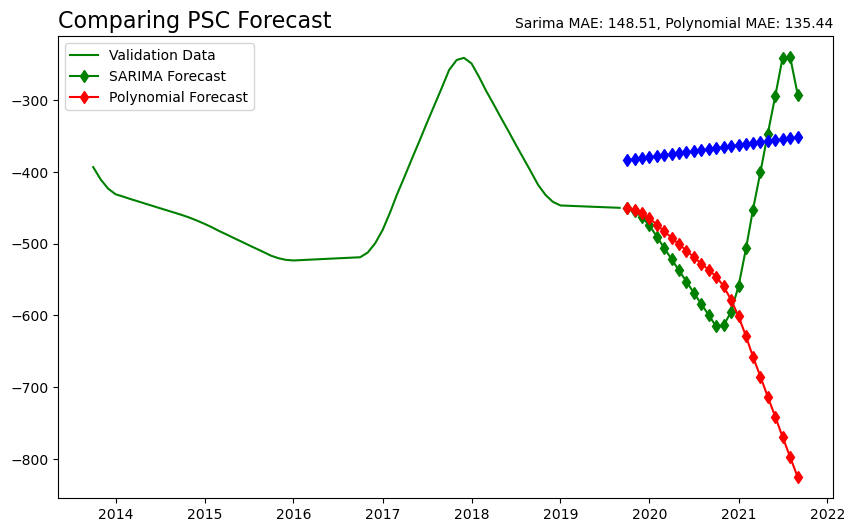

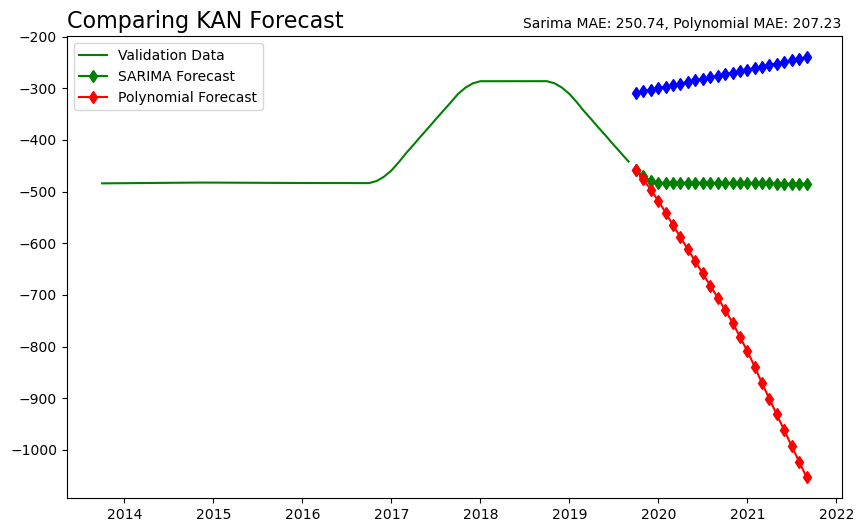

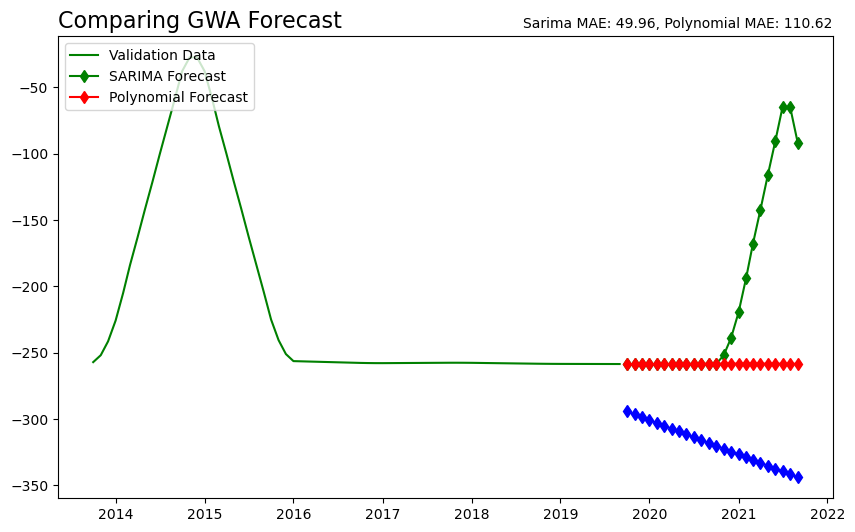

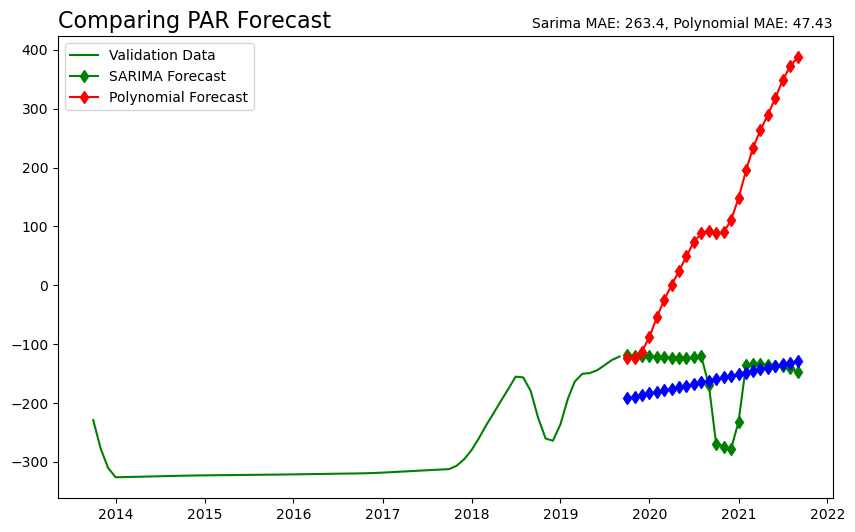

In [26]:
# Here is where the visuals are created showing the forecast of each.
# On each graph the MAE for both forecasts is presented, and the more accurate model is identified below the visual.
# The green line on each graph is the original validation data set.
# The red line is the SARIMA forecast.
# The blue line is the Polynomial forecast.

for basin in az_basins:
    if az_basins[basin][2] == 'maintained':    

        train_ds = az_basins[basin][3].copy()
        train_ds.reset_index(inplace=True)
        valid_ds = az_basins[basin][4].copy()
        valid_ds.reset_index(inplace=True)

        sarima_mae = round(az_basins[basin][8][0],2)
        poly_mae = round(az_basins[basin][13][0],2)
        
        x_train = train_ds['MEASUREMENT_DATE']
        y_train = train_ds['DEPTH_TO_WATER']
        x_valid = valid_ds['MEASUREMENT_DATE']
        y_valid = valid_ds['DEPTH_TO_WATER'] 
        y_sarima = az_basins[basin][9]
        y_poly = az_basins[basin][12]

        plt.figure(figsize=(10,6))
        plt.title(f"Comparing {basin} Forecast",size=16, loc='left')
        plt.title(f"Sarima MAE: {sarima_mae}, Polynomial MAE: {poly_mae}",size=10,loc='right')
        
        plt.plot(x_train, y_train, c='green')
        plt.plot(x_valid,y_valid, c='green', marker='d')
        plt.plot(x_valid,y_sarima,c='red', marker='d')
        plt.plot(x_valid,y_poly,c='blue', marker='d')
        
        plt.legend(['Validation Data', 'SARIMA Forecast', 'Polynomial Forecast'], loc = 'upper left')
        plt.show()

        print('\n')
    else:
        pass

Based on the MAE (Mean Absolute Error), the polynomial forecast is the more accurate forecast on 3 of the water basins analyzed. For the 4th basin, the Seasonal ARIMA forecast is likely still a better predictor than our current model.

Utilizing these current models, if they were retrained on a larger section of the dataset, it is likely that the forecasts would become more accurate.
It is likely that a more powerful machine learning model can surpass our current models.

If we were able to include other data such as rainfall over the area of the water basin, that could greatly improve the accuracy of our machine learning model as well.

In [28]:
# join the train and valid data sets, rerun and check on the final test data set

for basin in az_basins:
    if az_basins[basin][2] == 'maintained':
        print()
        print(basin)
        print()
        
        data = pd.concat([az_basins[basin][3]['DEPTH_TO_WATER'], az_basins[basin][4]['DEPTH_TO_WATER']])
        
        smodel = pm.auto_arima(data, start_p=1, start_q=1,
                          test='adf',
                          max_p=3, max_q=3,
                          m=12,
                          d=None,
                          seasonal=True,
                          start_P=0,
                          D=1,
                          trace=True,
                          error_action='ignore', 
                          suppress_warnings=True,
                          stepwise=True)

        key_name = basin
        az_basins[basin].append(smodel)    
        az_basins[basin].append(smodel.summary())
    
    else:
        pass
    
print('Complete')


DOU

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,1,1)[12]             : AIC=657.933, Time=0.15 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=673.268, Time=0.02 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=656.378, Time=0.09 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=655.998, Time=0.12 sec
 ARIMA(0,2,1)(0,1,0)[12]             : AIC=675.077, Time=0.05 sec
 ARIMA(0,2,1)(1,1,1)[12]             : AIC=656.405, Time=0.18 sec
 ARIMA(0,2,1)(0,1,2)[12]             : AIC=656.235, Time=0.22 sec
 ARIMA(0,2,1)(1,1,0)[12]             : AIC=656.394, Time=0.06 sec
 ARIMA(0,2,1)(1,1,2)[12]             : AIC=inf, Time=0.90 sec
 ARIMA(0,2,0)(0,1,1)[12]             : AIC=656.486, Time=0.05 sec
 ARIMA(0,2,2)(0,1,1)[12]             : AIC=656.560, Time=0.16 sec
 ARIMA(1,2,0)(0,1,1)[12]             : AIC=655.988, Time=0.10 sec
 ARIMA(1,2,0)(0,1,0)[12]             : AIC=675.086, Time=0.03 sec
 ARIMA(1,2,0)(1,1,1)[12]             : AIC=656.347, Time=0.15 sec
 ARIMA(1,2,0)(0,1,2)[12]       

In [29]:
# Here is where I will assess the accuracy of each model and determine a baseline for the accuracy of the machine learning models.

for basin in az_basins:
    if az_basins[basin][2] == 'maintained':    
        n_periods = 24
        fc = az_basins[basin][14].predict(n_periods = n_periods)
        index_of_fc = pd.date_range(az_basins[basin][5].index[0], periods = n_periods, freq = 'MS')
        fc_series = pd.Series(fc, index=index_of_fc)
        fc_frame = pd.DataFrame(fc_series)
        fc_frame.rename(columns={0: 'DEPTH_TO_WATER'}, inplace=True)
        s_mae = (fc_frame - az_basins[basin][5]).abs().mean()

        az_basins[basin].append(s_mae)
        az_basins[basin].append(fc_frame)

    else:
        pass

print('Complete')

Complete


In [30]:
for basin in az_basins:
    if az_basins[basin][2] == 'maintained':    
        train_ds = pd.concat([az_basins[basin][3], az_basins[basin][4]])
        train_ds.reset_index(inplace=True)

        x_train = train_ds['MEASUREMENT_DATE'].to_numpy()
        y_train = train_ds['DEPTH_TO_WATER'].to_numpy()

        valid_ds = az_basins[basin][5].copy()
        valid_ds.reset_index(inplace=True)

        x_test = valid_ds['MEASUREMENT_DATE'].to_numpy()
        y_test = valid_ds['DEPTH_TO_WATER'].to_numpy()

        X = np.arange(100).reshape(100, 1)
        y = X**4 + X**3 + X + 1

        rmses = []
        degrees = np.arange(1, 10)
        min_rmse, min_deg = 1e10, 1
        best_poly = 'tut'
        chosen_predict = 'tut'
        chosen_mae = 'tut'

        for deg in degrees:

            poly = PolynomialFeatures(degree = deg, include_bias = False)
            x_poly_train = poly.fit_transform(x_train.reshape(-1,1))
            poly_reg_model = LinearRegression()
            poly_reg_model.fit(x_poly_train, y_train)
            x_poly_test = poly.fit_transform(x_test.reshape(-1,1))
            poly_predict = poly_reg_model.predict(x_poly_test)
            poly_mse = mean_squared_error(y_test, poly_predict)
            poly_rmse = np.sqrt(poly_mse)
            rmses.append(poly_rmse)
            poly_mae = (pd.DataFrame(poly_predict) - pd.DataFrame(y_test)).abs().mean()

            if min_rmse > poly_rmse:
                min_rmse = poly_rmse
                min_deg = deg
                best_poly = poly_reg_model
                chosen_predict = poly_predict
                chosen_mae = poly_mae


        az_basins[basin].append(min_deg)
        az_basins[basin].append(best_poly)
        az_basins[basin].append(chosen_predict)
        az_basins[basin].append(chosen_mae)
    else:
        pass
    
print('Complete')


Complete


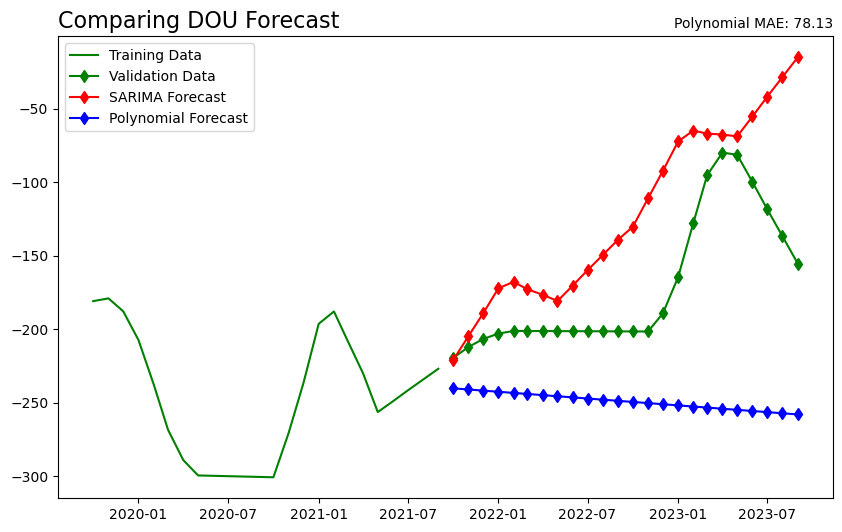

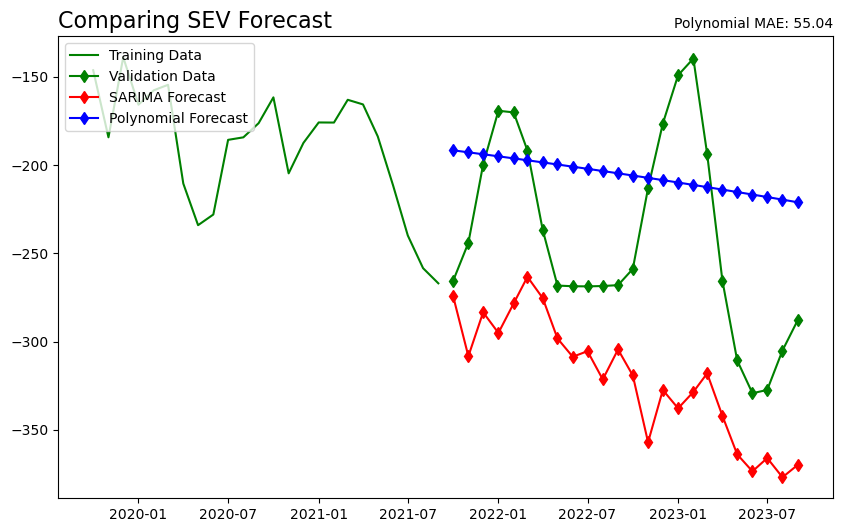

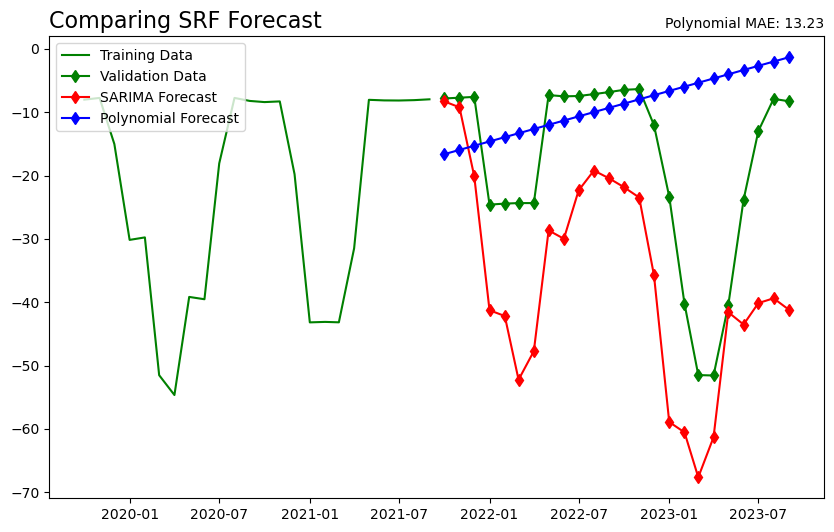

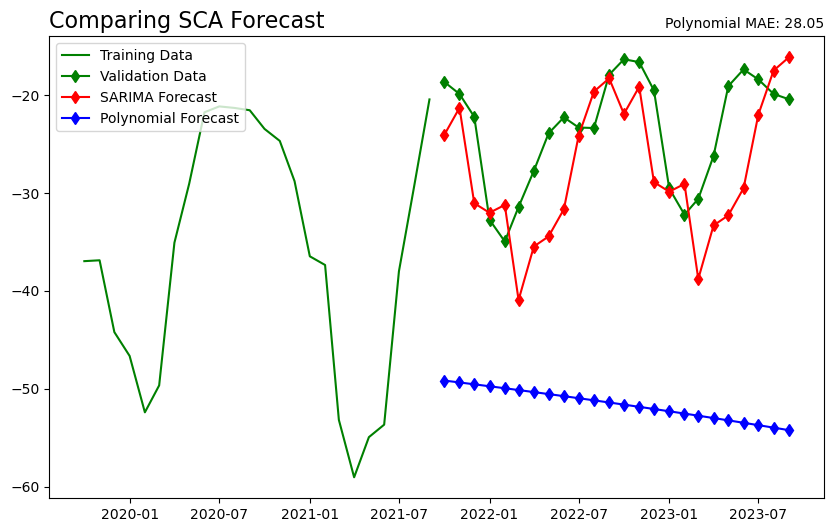

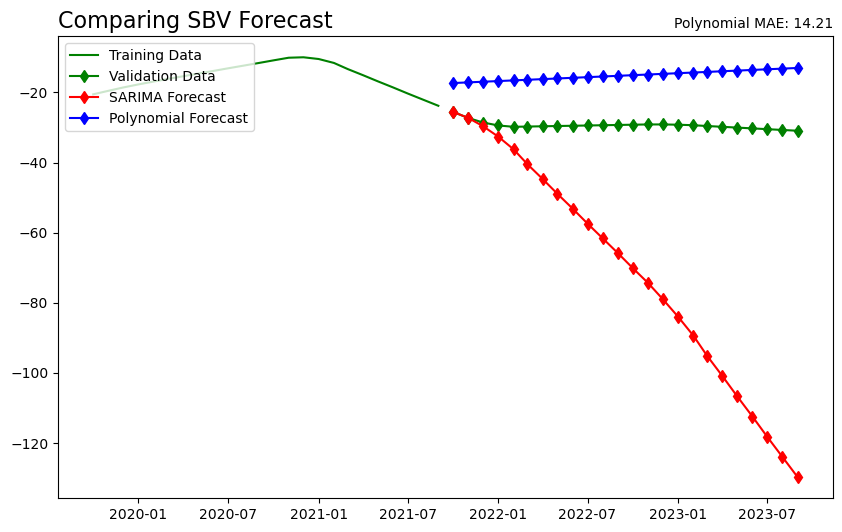

...

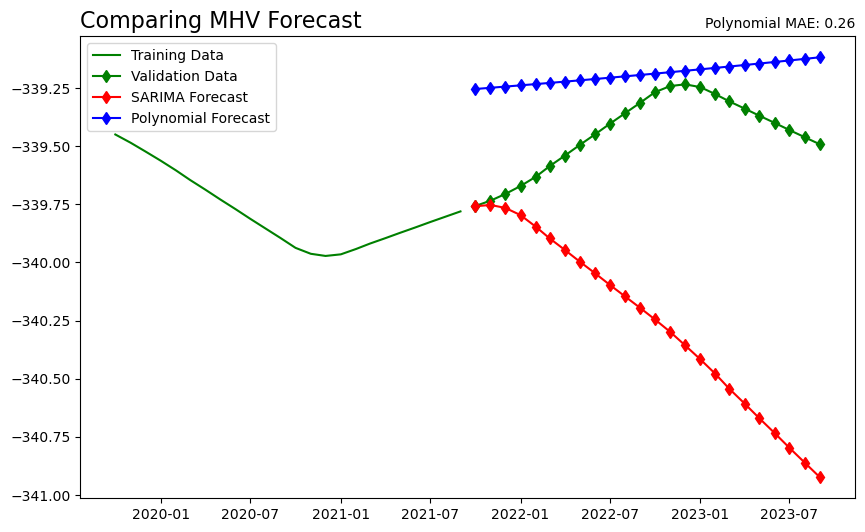

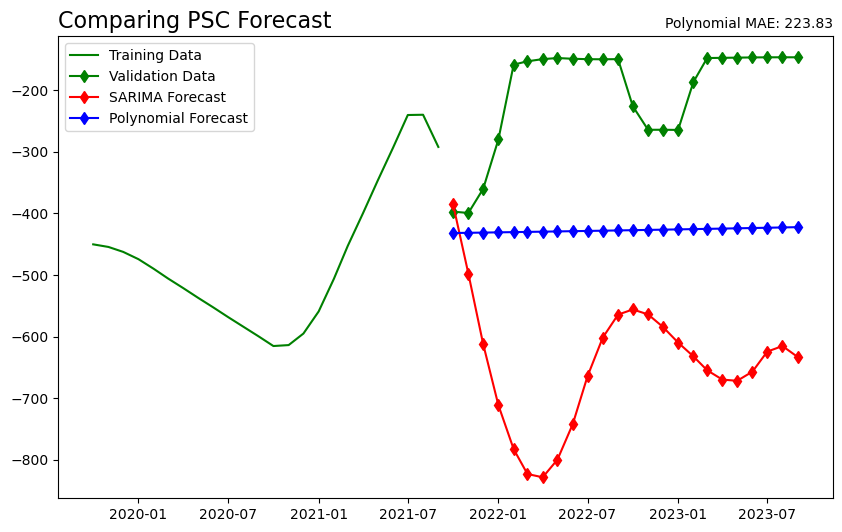

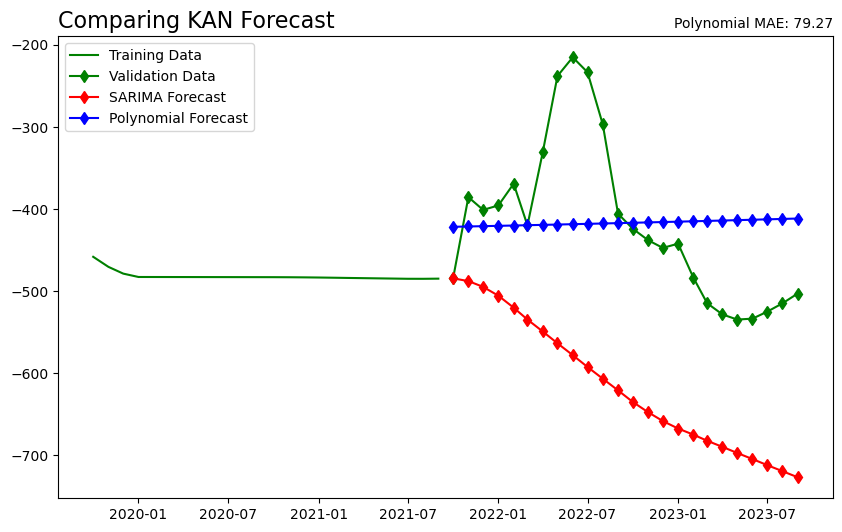

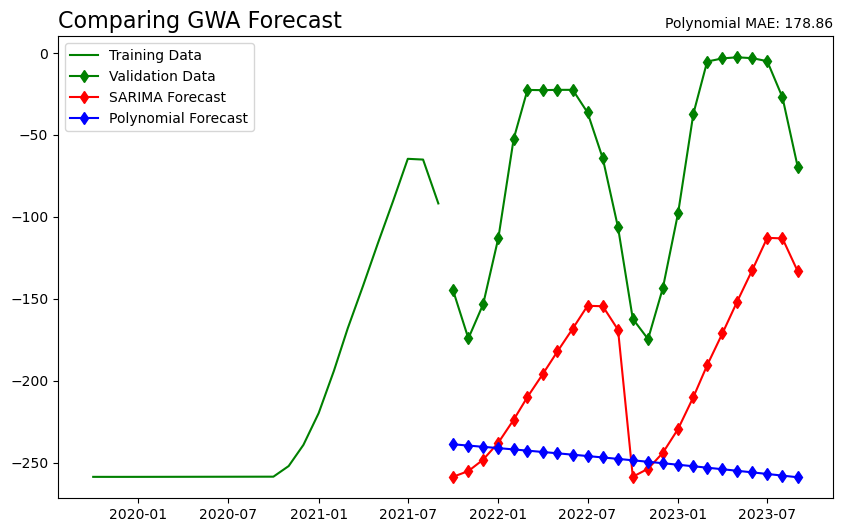

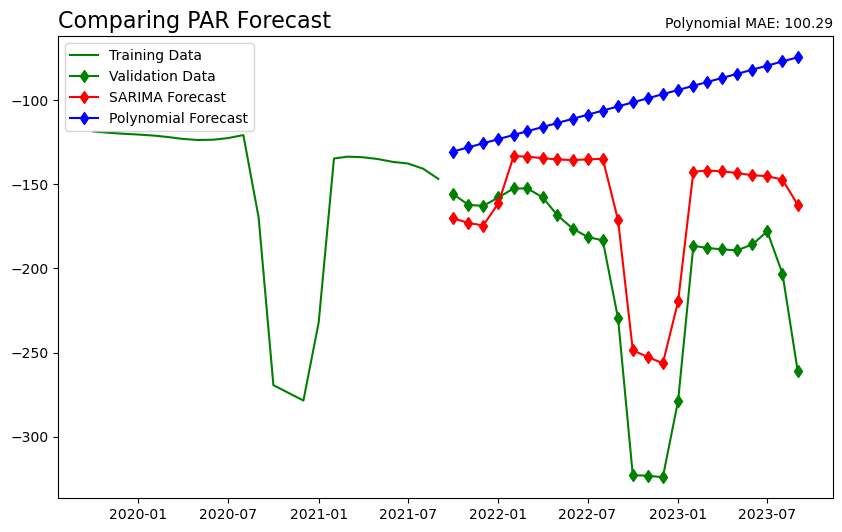

In [31]:
# These visuals were built not utilizing the entire training dataset, to increase the level of detail visible.

for basin in az_basins:
    if az_basins[basin][2] == 'maintained':    

        train_ds = az_basins[basin][4].copy()
        train_ds.reset_index(inplace=True)
        valid_ds = az_basins[basin][5].copy()
        valid_ds.reset_index(inplace=True)

        sarima_mae = round(az_basins[basin][16][0],2)
        poly_mae = round(az_basins[basin][21][0],2)

        x_train = train_ds['MEASUREMENT_DATE']
        y_train = train_ds['DEPTH_TO_WATER']
        x_valid = valid_ds['MEASUREMENT_DATE']
        y_valid = valid_ds['DEPTH_TO_WATER'] 
        y_sarima = az_basins[basin][17]
        y_poly = az_basins[basin][20]

        plt.figure(figsize=(10,6))
        plt.title(f"Comparing {basin} Forecast",size=16, loc='left')
        plt.title(f"Sarima MAE: {sarima_mae}, Polynomial MAE: {poly_mae}",size=10,loc='right')
        plt.title(f"Polynomial MAE: {poly_mae}",size=10, loc='right')

        plt.plot(x_train, y_train, c='green')
        plt.plot(x_valid,y_valid, c='green', marker='d')
        plt.plot(x_valid,y_sarima,c='red', marker='d')
        plt.plot(x_valid,y_poly,c='blue', marker='d')

        plt.legend(['Training Data', 'Validation Data', 'SARIMA Forecast', 'Polynomial Forecast'], loc = 'upper left')
        plt.show()

        print('\n')
    else:
        pass

In [32]:
for basin in az_basins:
    if az_basins[basin][2] == 'maintained':
        print()
        print(basin)
        print()
        
        data = pd.concat([az_basins[basin][3]['DEPTH_TO_WATER'], az_basins[basin][4]['DEPTH_TO_WATER'], az_basins[basin][5]['DEPTH_TO_WATER']])
        
        smodel = pm.auto_arima(data, start_p=1, start_q=1,
                          test='adf',
                          max_p=3, max_q=3,
                          m=12,
                          d=None,
                          seasonal=True,
                          start_P=0,
                          D=1,
                          trace=True,
                          error_action='ignore', 
                          suppress_warnings=True,
                          stepwise=True)

        key_name = basin
        az_basins[basin].append(smodel)    
        az_basins[basin].append(smodel.summary())
    
    else:
        pass
    
print('Complete')


DOU

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,1,1)[12]             : AIC=inf, Time=0.33 sec
 ARIMA(0,2,0)(0,1,0)[12]             : AIC=870.850, Time=0.02 sec
 ARIMA(1,2,0)(1,1,0)[12]             : AIC=847.937, Time=0.07 sec
 ARIMA(0,2,1)(0,1,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(1,2,0)(0,1,0)[12]             : AIC=871.531, Time=0.04 sec
 ARIMA(1,2,0)(2,1,0)[12]             : AIC=841.672, Time=0.16 sec
 ARIMA(1,2,0)(2,1,1)[12]             : AIC=inf, Time=0.90 sec
 ARIMA(1,2,0)(1,1,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(0,2,0)(2,1,0)[12]             : AIC=845.451, Time=0.12 sec
 ARIMA(2,2,0)(2,1,0)[12]             : AIC=843.517, Time=0.22 sec
 ARIMA(1,2,1)(2,1,0)[12]             : AIC=843.625, Time=0.22 sec
 ARIMA(0,2,1)(2,1,0)[12]             : AIC=842.064, Time=0.18 sec
 ARIMA(2,2,1)(2,1,0)[12]             : AIC=inf, Time=1.03 sec
 ARIMA(1,2,0)(2,1,0)[12] intercept   : AIC=843.587, Time=0.49 sec

Best model:  ARIMA(1,2,0)(2,1,0)[12]          

In [33]:
for basin in az_basins:
    if az_basins[basin][2] == 'maintained':    
        n_periods = 24
        fc = az_basins[basin][22].predict(n_periods = n_periods)
        index_of_fc = pd.date_range('2023-09-01', periods = n_periods, freq = 'MS')
        fc_series = pd.Series(fc, index=index_of_fc)
        fc_frame = pd.DataFrame(fc_series)
        fc_frame.rename(columns={0: 'DEPTH_TO_WATER'}, inplace=True)

        az_basins[basin].append(fc_frame)

    else:
        pass

print('Complete')

Complete


In [34]:
for basin in az_basins:
    if az_basins[basin][2] == 'maintained':    
        train_ds = pd.concat([az_basins[basin][3], az_basins[basin][4] , az_basins[basin][5]])
        train_ds.reset_index(inplace=True)

        x_train = train_ds['MEASUREMENT_DATE'].to_numpy()
        y_train = train_ds['DEPTH_TO_WATER'].to_numpy()
        trials = pd.date_range('2023-09-01', periods = n_periods, freq = 'MS')

        x_test = trials.to_numpy()

        poly = PolynomialFeatures(degree = az_basins[basin][18], include_bias = False)
        x_poly_train = poly.fit_transform(x_train.reshape(-1,1))
        poly_reg_model = az_basins[basin][19]
        poly_reg_model.fit(x_poly_train, y_train)
        x_poly_test = poly.fit_transform(x_test.reshape(-1,1))
        poly_predict = poly_reg_model.predict(x_poly_test)

        az_basins[basin].append(poly_predict)

    else:
        pass
    
print('Complete')

Complete


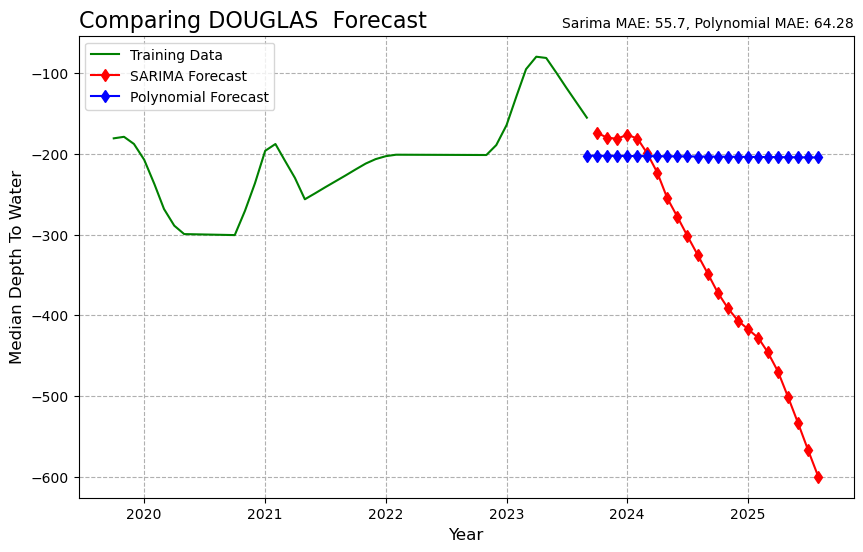

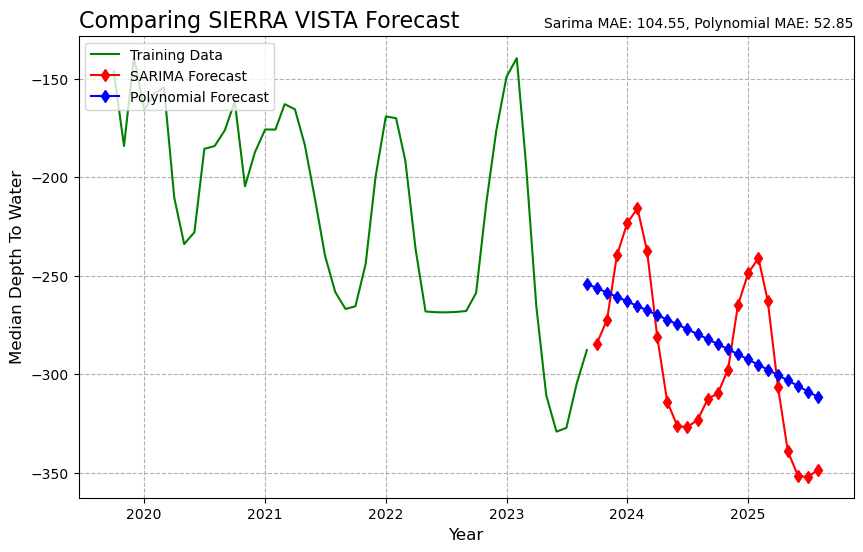

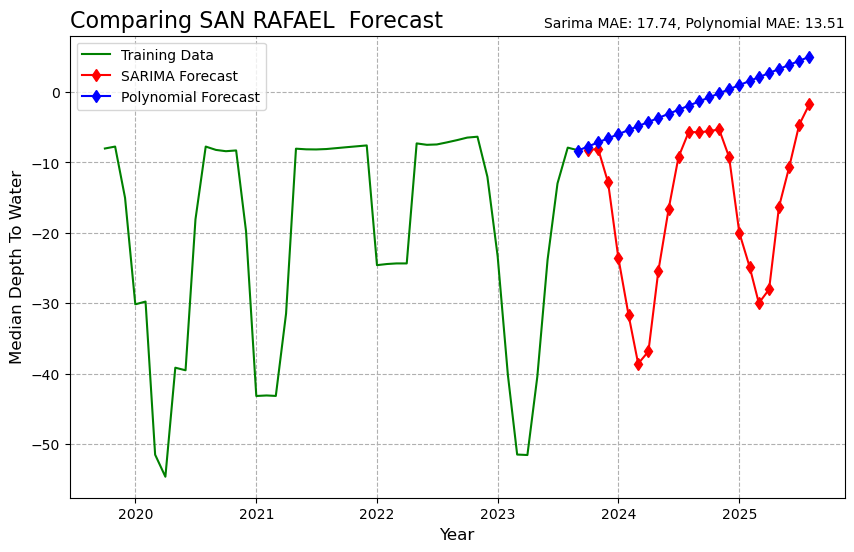

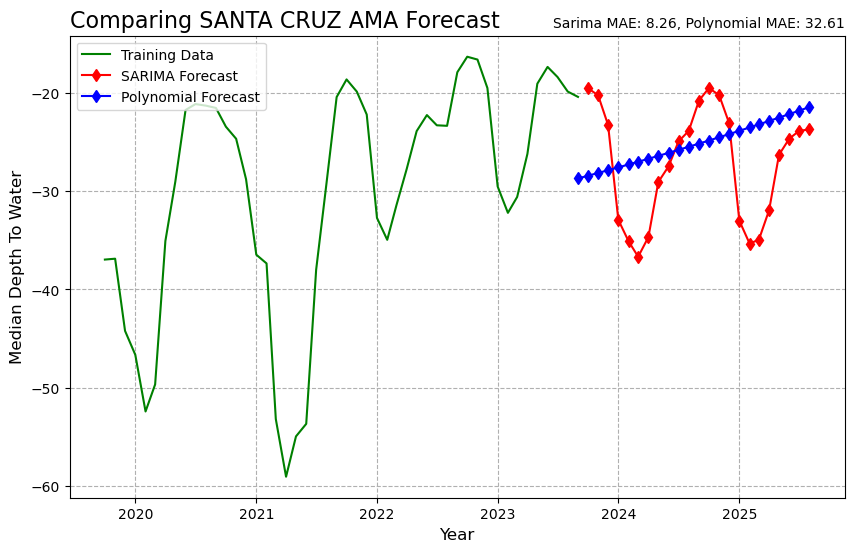

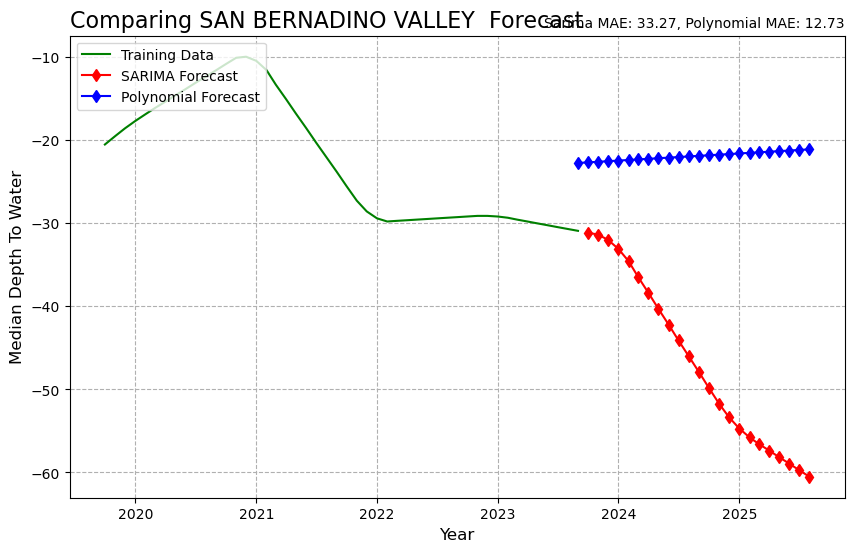

...

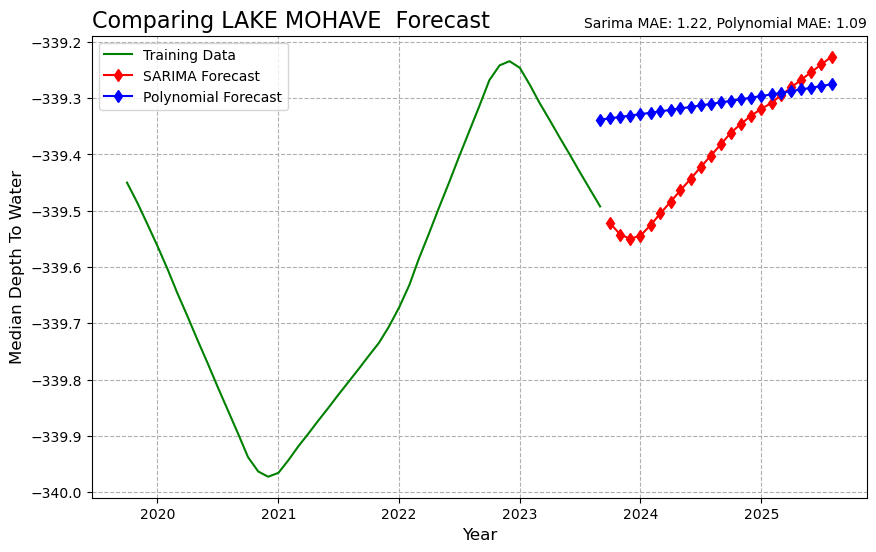

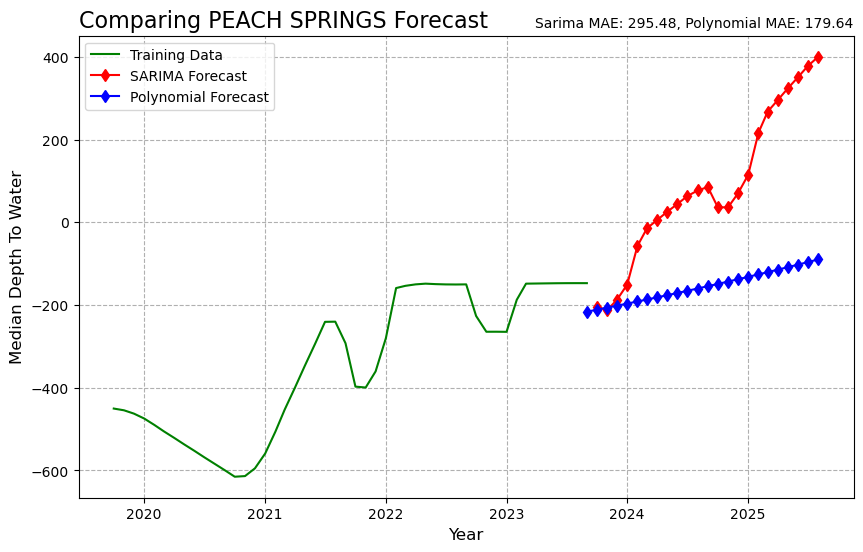

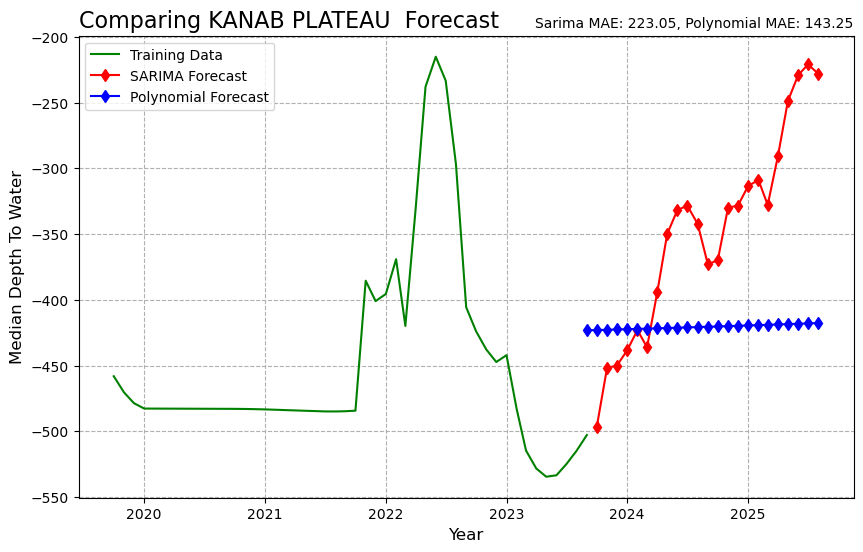

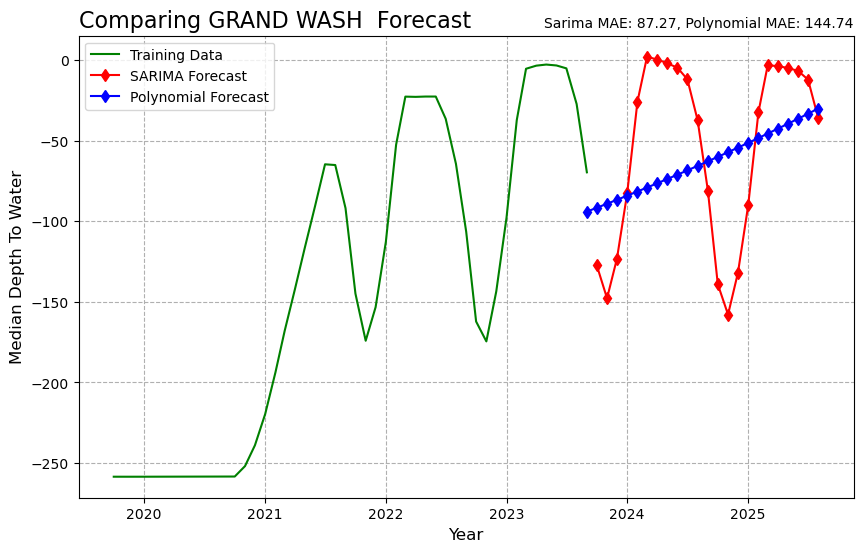

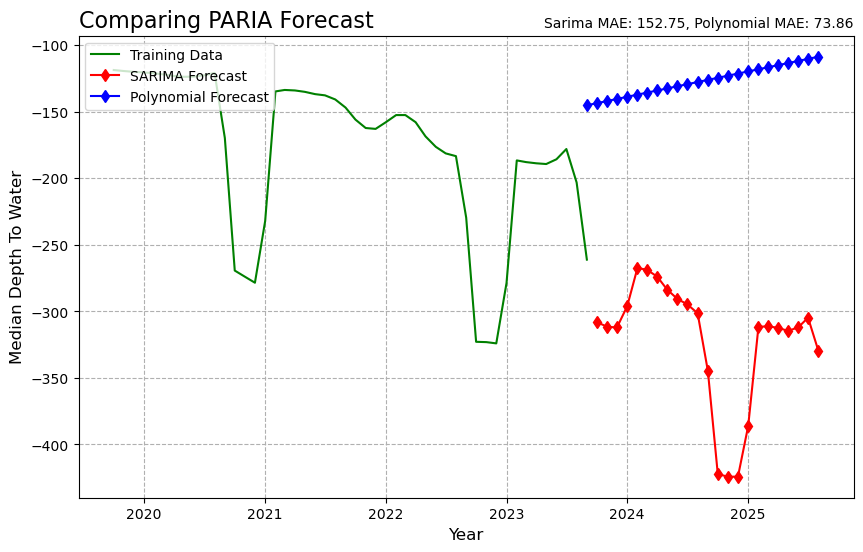

In [35]:
for basin in az_basins:
    if az_basins[basin][2] == 'maintained':
        
        name  = az_basins[basin][0]['CODE_DESCRIPTION'].min()

        train_ds = pd.concat([az_basins[basin][4], az_basins[basin][5]])
        train_ds.reset_index(inplace=True)

        trials = pd.date_range('2023-09-01', periods = 24, freq = 'MS')
        
        sarima_mae = round((az_basins[basin][8][0] + az_basins[basin][16][0])/2,2)
        poly_mae = round((az_basins[basin][13][0] + az_basins[basin][21][0])/2,2)

        x_train = train_ds['MEASUREMENT_DATE']
        y_train = train_ds['DEPTH_TO_WATER']

        x_forecast = trials

        y_sarima = az_basins[basin][24]
        y_poly = az_basins[basin][25]

        plt.figure(figsize=(10,6))
        plt.title(f"Comparing {name} Forecast",size=16, loc='left')
        plt.title(f"Sarima MAE: {sarima_mae}, Polynomial MAE: {poly_mae}",size=10,loc='right')
        plt.xlabel('Year', size = 12)
        plt.ylabel('Median Depth To Water', size=12)
        plt.grid(visible=True, which='major', axis='both', linestyle = '--')

        plt.plot(x_train, y_train, c='green')
        plt.plot(x_forecast,y_sarima,c='red', marker='d')
        plt.plot(x_forecast,y_poly,c='blue', marker='d')

        plt.legend(['Training Data', 'SARIMA Forecast', 'Polynomial Forecast'], loc = 'upper left')
                
        plt.savefig(f'{name}_forecast_2026.png')
        
        plt.show()
 
        print('\n')
    else:
        pass